In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('Social_Network_Ads.csv')
data.head()

,User ID,Gender,Age,EstimatedSalary,Purchased
0,15624510,Male,19,19000,0
1,15810944,Male,35,20000,0
2,15668575,Female,26,43000,0
3,15603246,Female,27,57000,0
4,15804002,Male,19,76000,0


In [3]:
dataset = data.drop(['Gender','User ID'],axis=1)

In [4]:
dataset

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [5]:
dataset.shape

(400, 3)

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Age              400 non-null    int64
 1   EstimatedSalary  400 non-null    int64
 2   Purchased        400 non-null    int64
dtypes: int64(3)
memory usage: 9.5 KB


<AxesSubplot:xlabel='Purchased', ylabel='Density'>

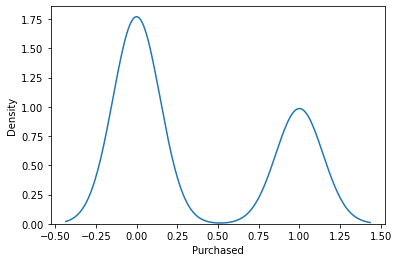

In [7]:
import seaborn as sns
sns.kdeplot(dataset['Purchased'])

<AxesSubplot:xlabel='Age', ylabel='Density'>

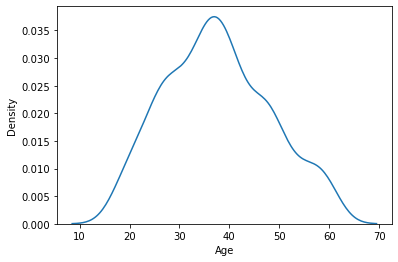

In [8]:
sns.kdeplot(dataset['Age'])

In [14]:
X = dataset.iloc[:,:-1].values

Y = dataset.iloc[:,-1].values
Y.shape

(400,)

In [15]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=.25,random_state=0)

In [16]:
X_train.shape

(300, 2)

In [17]:
Y_test[:3]

array([0, 0, 0], dtype=int64)

In [18]:
print(Y_train) #training dataset

[0 1 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 1 0 1 0 1 0 0 1
 0 0 1 0 0 0 0 0 1 1 1 1 0 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 1 0 0 1 0 1
 1 1 0 0 1 1 0 0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 1 1 0 1 1 0
 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 0 0 0 0 1 0 0 0 1 1 0 0
 0 0 1 0 1 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 0 1 0 0
 0 0 0 0 1 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0
 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0
 0 0 1 0 1 1 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1
 0 0 0 0]


In [19]:
print(Y_test) #testing data set

[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 1
 0 0 0 0 1 1 1 0 0 0 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 1]


# Feature Scaling

In [20]:
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()

In [21]:
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [22]:
print(X_train[0:10])

[[ 0.58164944 -0.88670699]
 [-0.60673761  1.46173768]
 [-0.01254409 -0.5677824 ]
 [-0.60673761  1.89663484]
 [ 1.37390747 -1.40858358]
 [ 1.47293972  0.99784738]
 [ 0.08648817 -0.79972756]
 [-0.01254409 -0.24885782]
 [-0.21060859 -0.5677824 ]
 [-0.21060859 -0.19087153]]


In [23]:
print(X_test[0:10])

[[-0.80480212  0.50496393]
 [-0.01254409 -0.5677824 ]
 [-0.30964085  0.1570462 ]
 [-0.80480212  0.27301877]
 [-0.30964085 -0.5677824 ]
 [-1.10189888 -1.43757673]
 [-0.70576986 -1.58254245]
 [-0.21060859  2.15757314]
 [-1.99318916 -0.04590581]
 [ 0.8787462  -0.77073441]]


# Training of random forest classifier

## By entropy method

In [24]:
from sklearn.ensemble import RandomForestClassifier

In [25]:
classifier = RandomForestClassifier(n_estimators=15,criterion='entropy',random_state=0)
classifier.fit(X_train,Y_train)

RandomForestClassifier(criterion='entropy', n_estimators=15, random_state=0)

In [26]:
print(classifier.predict(sc.transform([[30,87000]])))

[0]


## predicting test result
### visualising technique not require

In [28]:
y_predict = classifier.predict(X_test)
print(np.concatenate((y_predict.reshape(len(y_predict),1),Y_test.reshape(len(Y_test),1)),1))

[[0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 0]
 [1 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [1 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [1 1]
 [1 1]
 [1 0]
 [0 0]
 [0 0]
 [1 1]
 [0 1]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [0 0]
 [1 1]
 [1 1]
 [1 1]]


## Confusing matrix for bettter visualizing

In [29]:
from sklearn.metrics import confusion_matrix , accuracy_score
cm = confusion_matrix(Y_test,y_predict)
print(cm)

[[62  6]
 [ 3 29]]


In [30]:
accuracy = accuracy_score(Y_test,y_predict)
print(accuracy*100,'%')

91.0 %


**by entropy method we get 91% accuracy**

**now time to visualize**

In [31]:
import PIL
import pydotplus
from glob import glob
from IPython.display import display , Image
from sklearn.tree import export_graphviz

In [32]:
def decision_tree(clf,tree_to_generate , feature , target):
    filename = "Purcha_" +str(tree_to_generate)+ ".png"
    dot_data = export_graphviz(
        clf,
        out_file=None,
        feature_names=feature,
        class_names=target,
        rounded=True,
        proportion=False,
        precision=2,
        filled=True
    )
    graph = pydotplus.graph_from_dot_data(dot_data)
    graph.write_png(filename)
    print("Desicion tree {} save as : ".format(tree_to_generate+1))

In [33]:
col =  dataset.columns.tolist()
feature_names = col[:2]
target_name =col[2]

In [34]:
feature_names

['Age', 'EstimatedSalary']

In [35]:
target_name

'Purchased'

In [36]:
classifier.estimators_

[DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=209652396),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=398764591),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=924231285),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=1478610112),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=441365315),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=1537364731),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=192771779),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
                        random_state=1491434855),
 DecisionTreeClassifier(criterion='entropy', max_features='auto',
           

In [37]:
for i in range(len(classifier.estimators_)):
    decision_tree(classifier.estimators_[i],i,feature_names,target_name)

Desicion tree 1 save as : 
Desicion tree 2 save as : 
Desicion tree 3 save as : 
Desicion tree 4 save as : 
Desicion tree 5 save as : 
Desicion tree 6 save as : 
Desicion tree 7 save as : 
Desicion tree 8 save as : 
Desicion tree 9 save as : 
Desicion tree 10 save as : 
Desicion tree 11 save as : 
Desicion tree 12 save as : 
Desicion tree 13 save as : 
Desicion tree 14 save as : 
Desicion tree 15 save as : 


In [38]:
images_to_show = [PIL.Image.open(f) for f in glob('./*.png')]
images_to_show

[<PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2271x1688 at 0x20D6F4143D0>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2215x2323 at 0x20D6D7B9880>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=3143x1688 at 0x20D6F8899D0>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2645x1529 at 0x20D6F889910>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2756x1847 at 0x20D6F889A30>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2085x2164 at 0x20D6F889A90>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2761x1688 at 0x20D6F889AF0>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2974x2005 at 0x20D6F889B50>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1703x2323 at 0x20D6F889BB0>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2543x1529 at 0x20D6F889C10>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2537x1688 at 0x20D6F889C70>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2191x2323 at 0x20D6F8

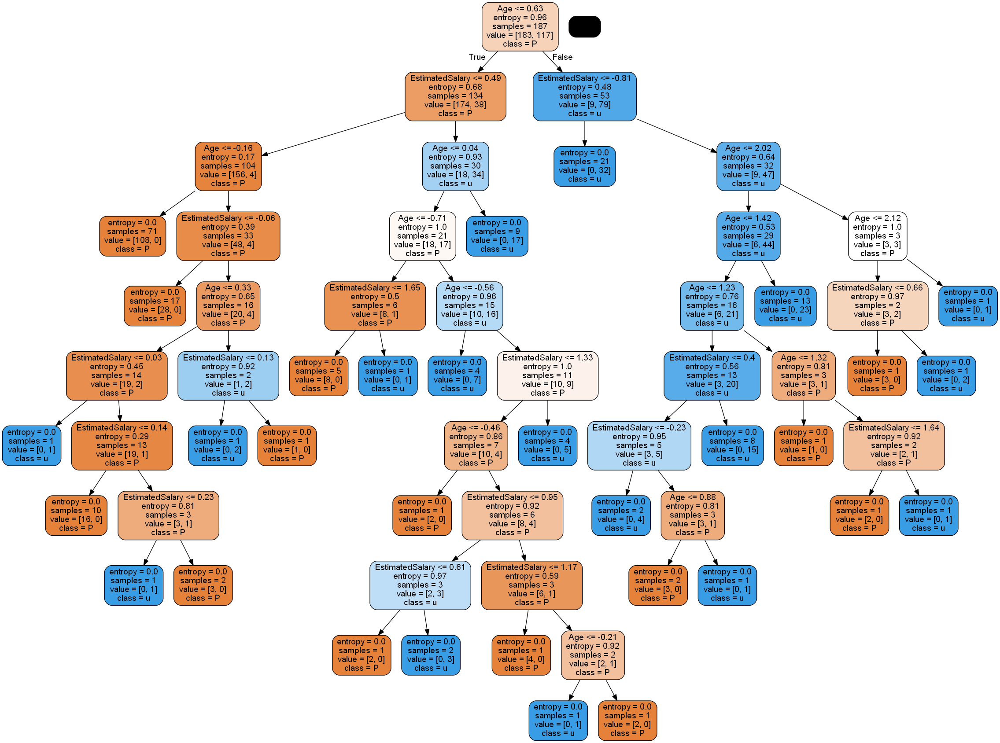

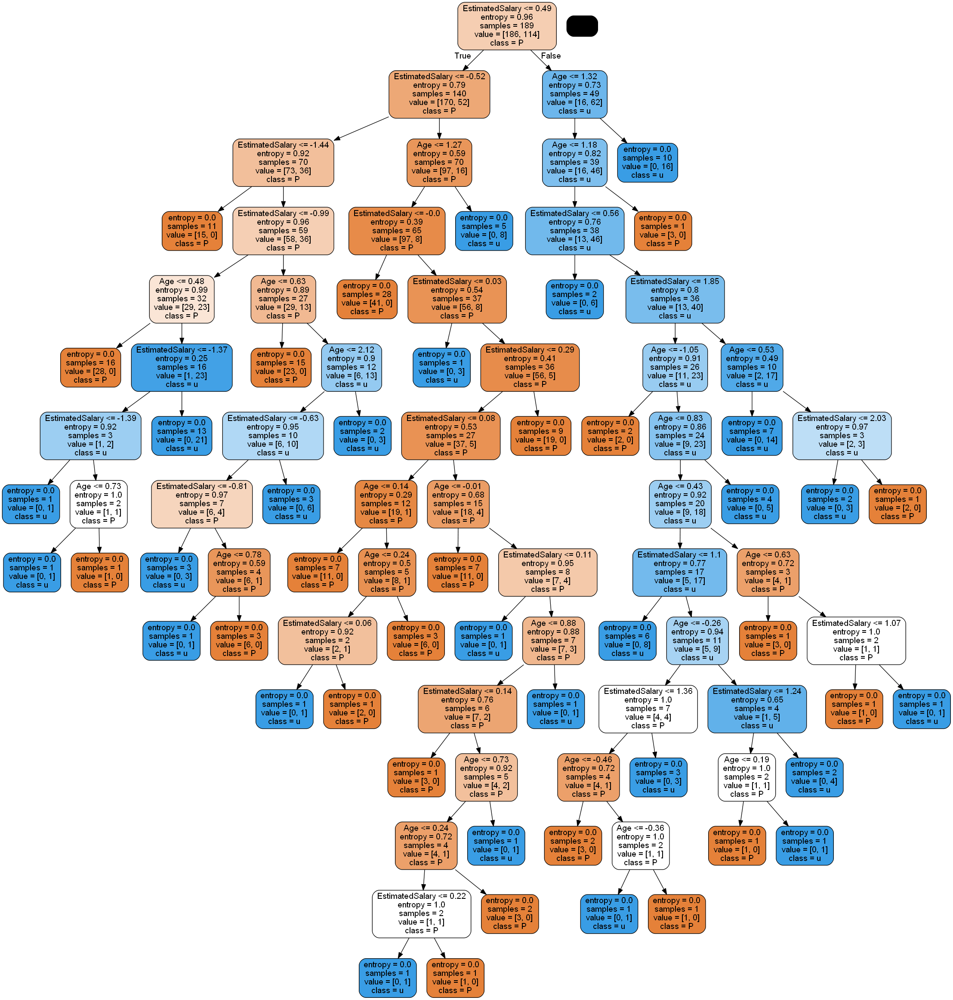

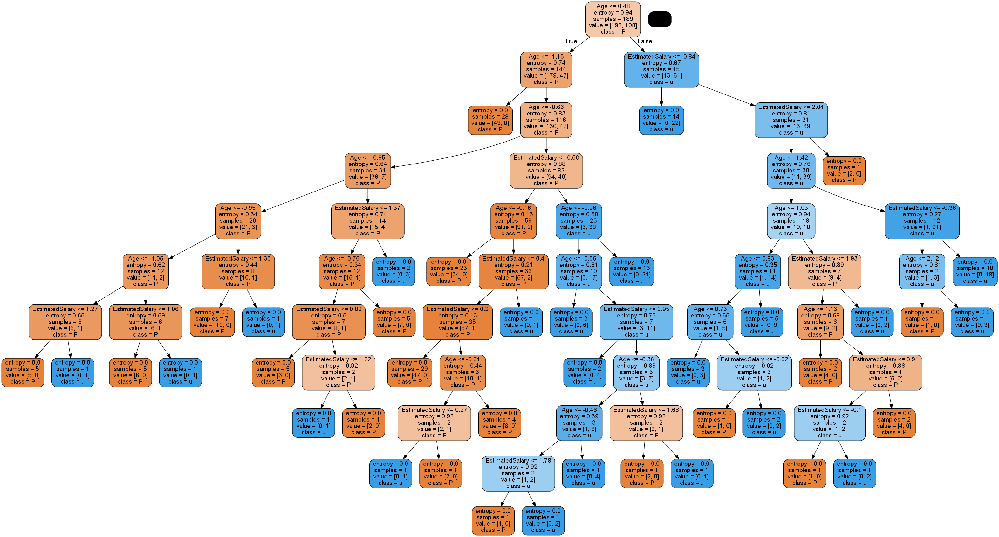

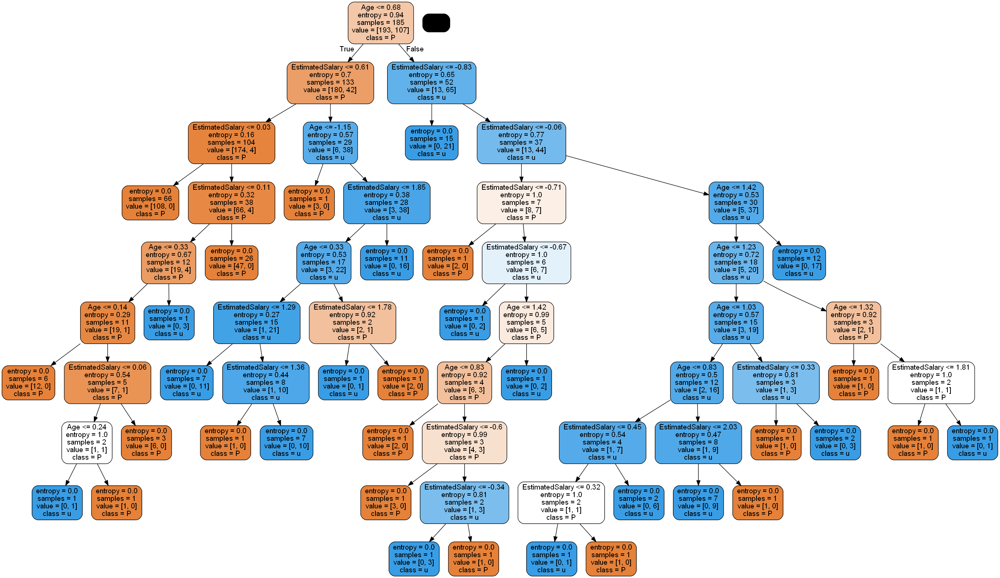

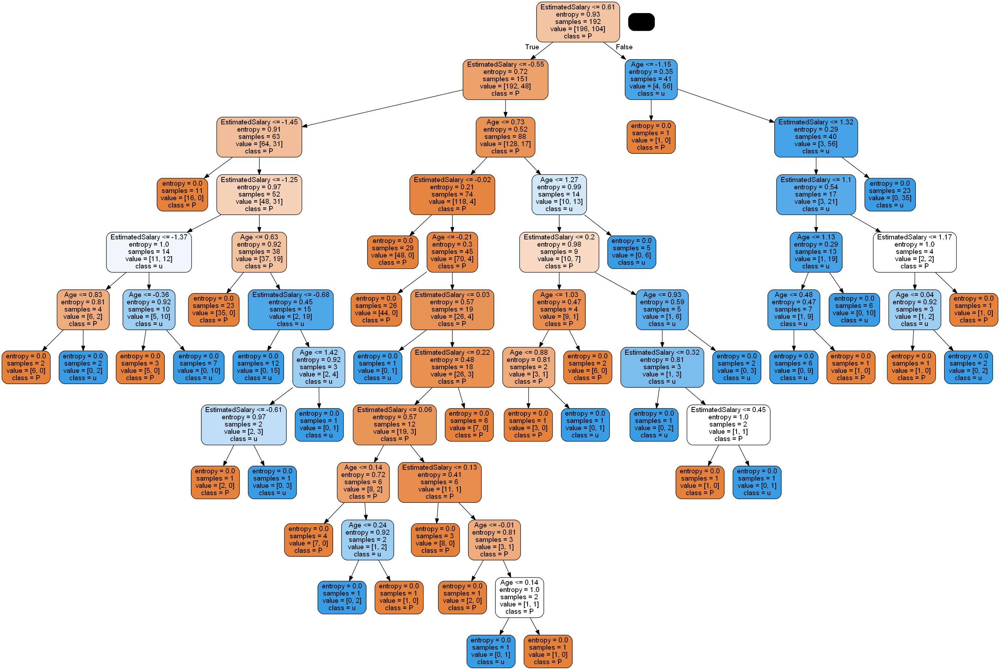

...

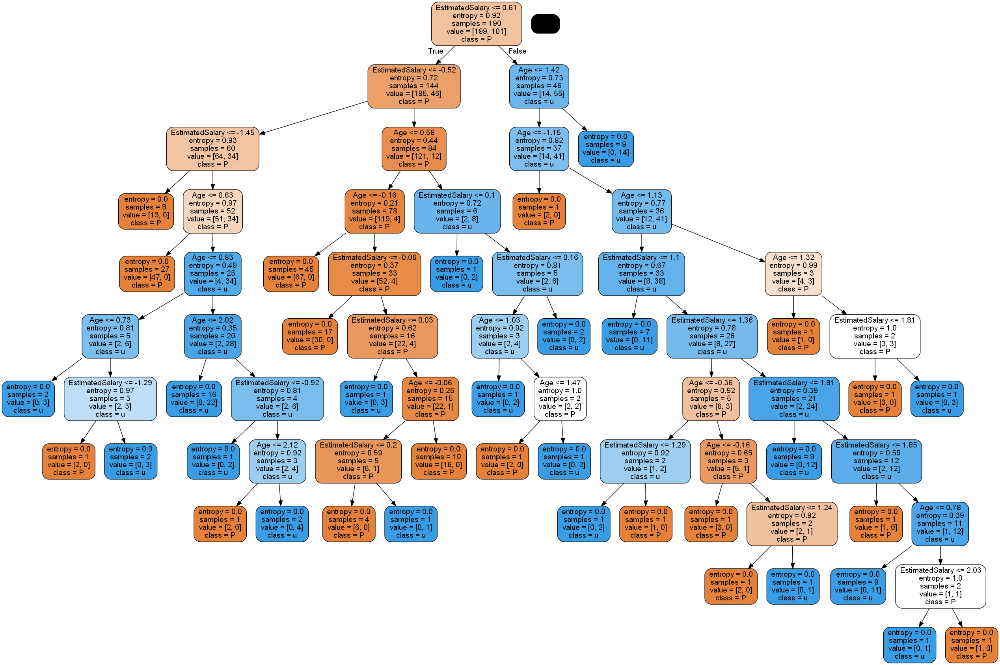

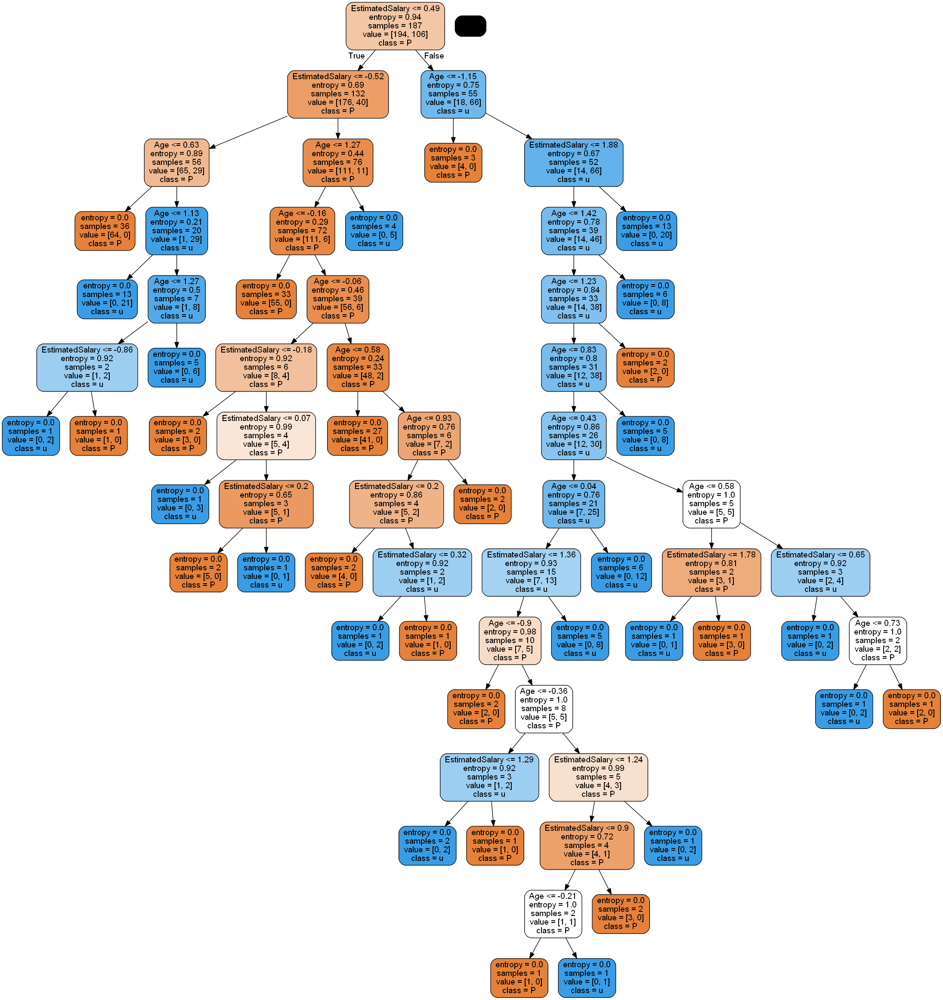

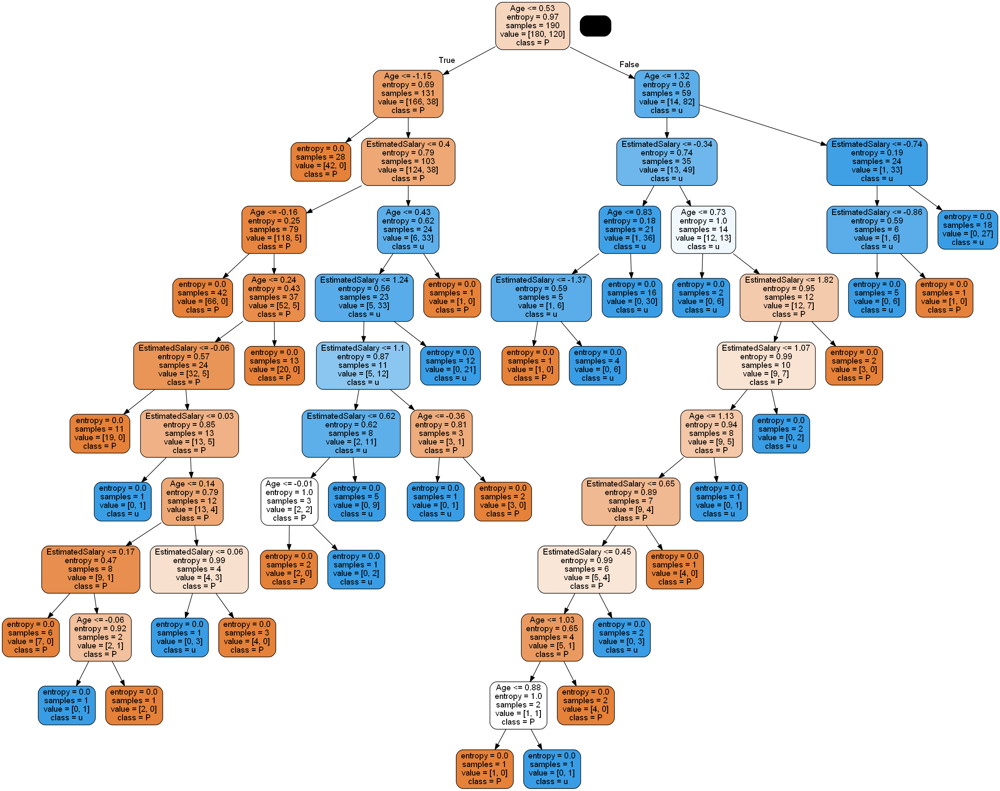

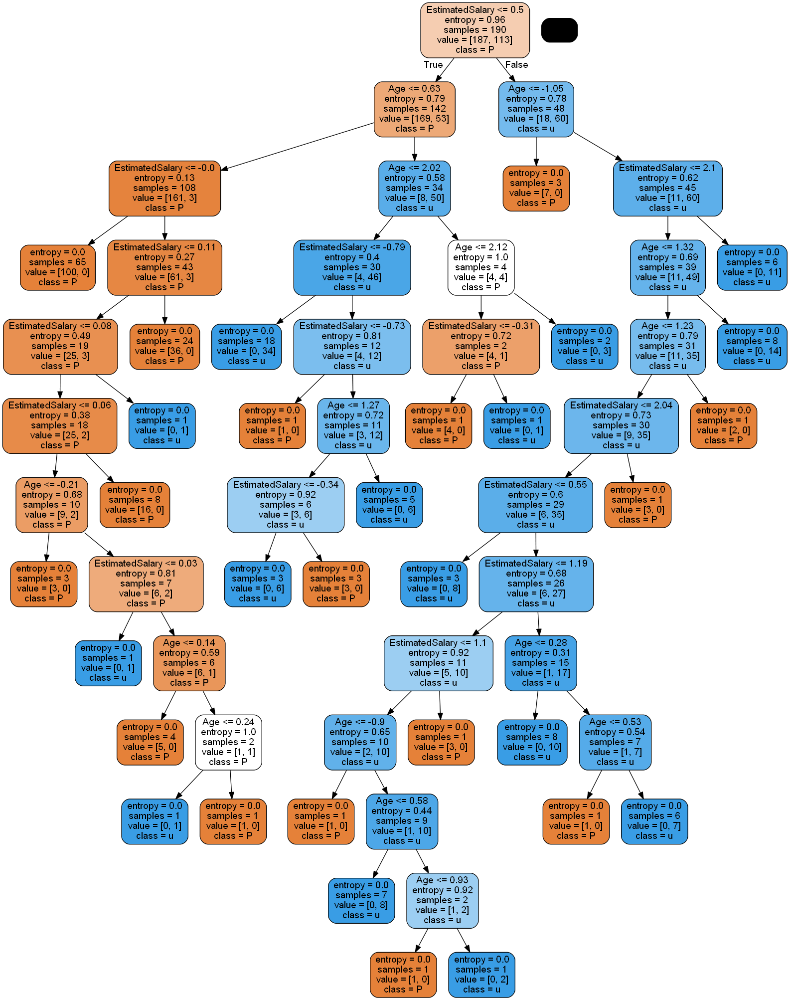

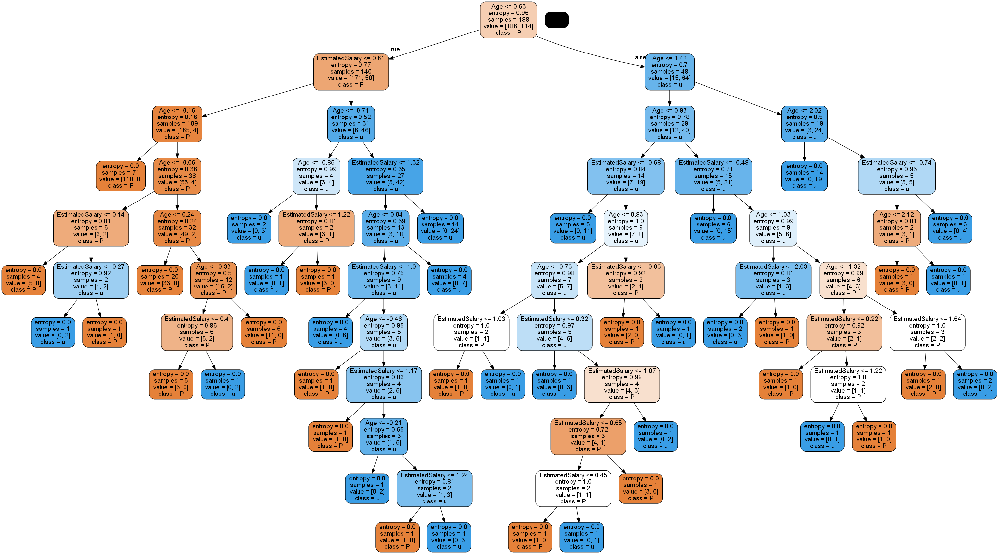

In [39]:
for i in images_to_show:
    a=display(Image(filename=i.filename,retina=True))
    a

**apply gini method lets see whether the accuracy will increase or decrease**

In [29]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=15,criterion='gini',random_state=0)
classifier.fit(X_train,Y_train)

RandomForestClassifier(n_estimators=15, random_state=0)

In [30]:
print(classifier.predict(sc.transform([[30,87000]])))

[0]


In [31]:
y_predic = classifier.predict(X_test)
print(np.concatenate((y_predict.reshape(len(y_predic),1),Y_test.reshape(len(Y_test),1)),1))

[[0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 0]
 [1 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [1 0]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 0]
 [1 1]
 [1 1]
 [1 1]
 [1 0]
 [0 0]
 [0 0]
 [1 1]
 [0 1]
 [0 0]
 [1 1]
 [1 1]
 [0 0]
 [0 0]
 [1 1]
 [0 0]
 [0 0]
 [0 0]
 [0 1]
 [0 0]
 [1 1]
 [1 1]
 [1 1]]


In [32]:
from sklearn.metrics import confusion_matrix , accuracy_score
cm = confusion_matrix(Y_test,y_predict)
print(cm)

[[62  6]
 [ 3 29]]


In [33]:
acuracy = accuracy_score(Y_test,y_predict)
print(acuracy*100,'%')

91.0 %


*as we have seen that accuracy has increase by the gini method*